In [47]:
# Importing the packages
import os
import sys
sys.path.append(os.path.join(".."))
import cv2
import numpy as np
from utils_ross.imutils import jimshow
from utils_ross.imutils import jimshow_channel
import matplotlib.pyplot as plt

In [48]:
# Get working directory
os.getcwd()

'/home/cds-au579253/cds-visual/Homework/Assignment3/src'

In [49]:
#Defining the path to the image
image1 = os.path.join("..", "Data", "Image_assignment3.jpg")
#Reading the image
image = cv2.imread(image1)

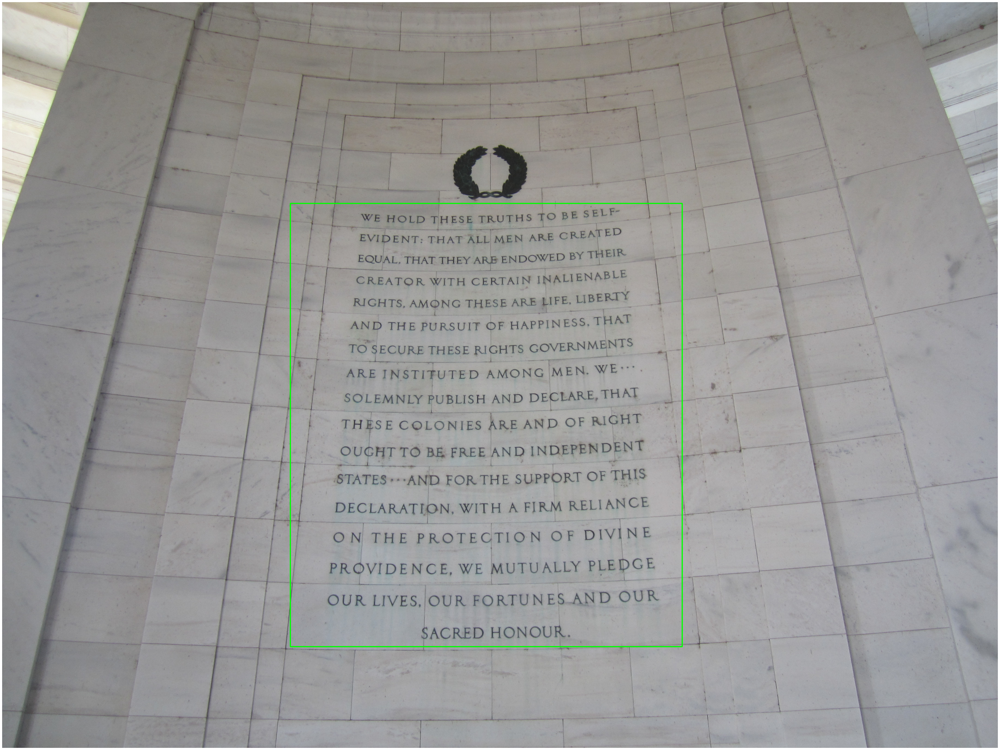

In [50]:
#Creating the green rectangle box of the region of interest
cv2.rectangle(image, (1250,875), (2950, 2800), (0, 255, 0), 3) #cv2.rectangle( input, start_point, end_pont, color, thickness)
#Showing the image with ROI
jimshow(image)

In [51]:
#Saving the cropped image as image_cropped.jpg
cv2.imwrite(os.path.join("..", "Output", "image_with_ROI.jpg"), image)

True

__Cropping the image__

In [52]:
#Defining the center of the image
(centerX, centerY) = (image.shape[1]//2, image.shape[0]//2)

In [53]:
#Cropping the image based on the centers
cropped_image = image[centerY-750:centerY+1150, centerX-750: centerX +700]

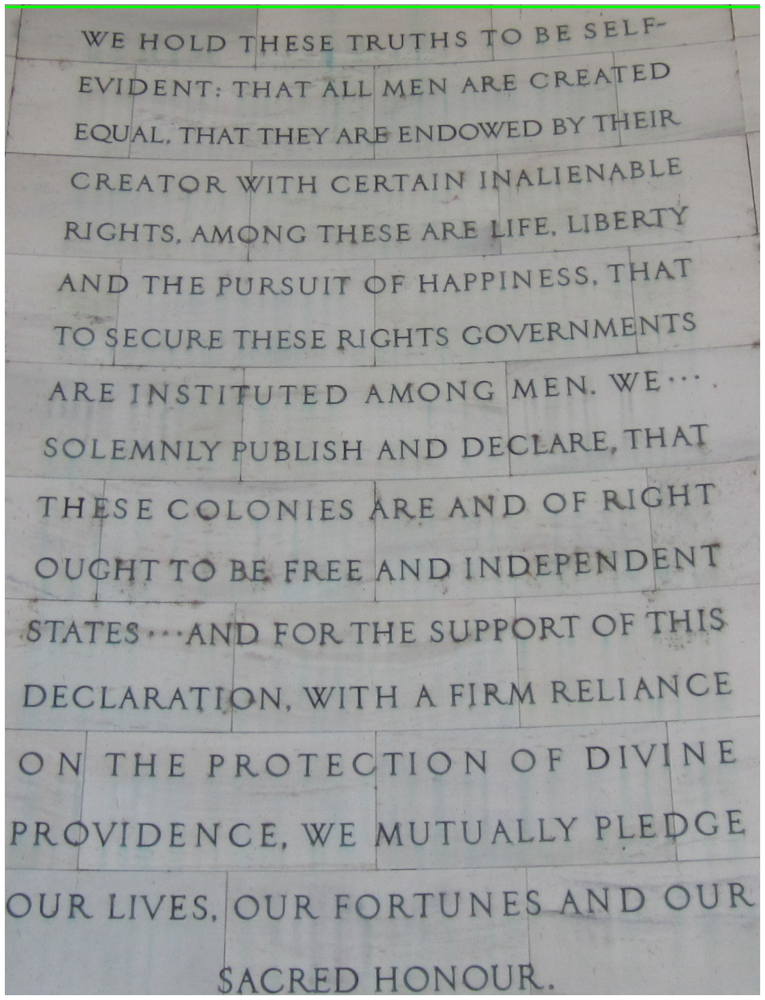

In [54]:
# Showing the cropped image
jimshow(cropped_image)

In [55]:
#Saving the cropped image as image_cropped.jpg
cv2.imwrite(os.path.join("..", "Output", "image_cropped.jpg"), cropped_image)

True

__Finding every letter in the image__

In [56]:
#blur image to remove noise
blurred_image = cv2.blur(cropped_image, (3,3)) #Input is the cropped image and the other parameter is kernel size

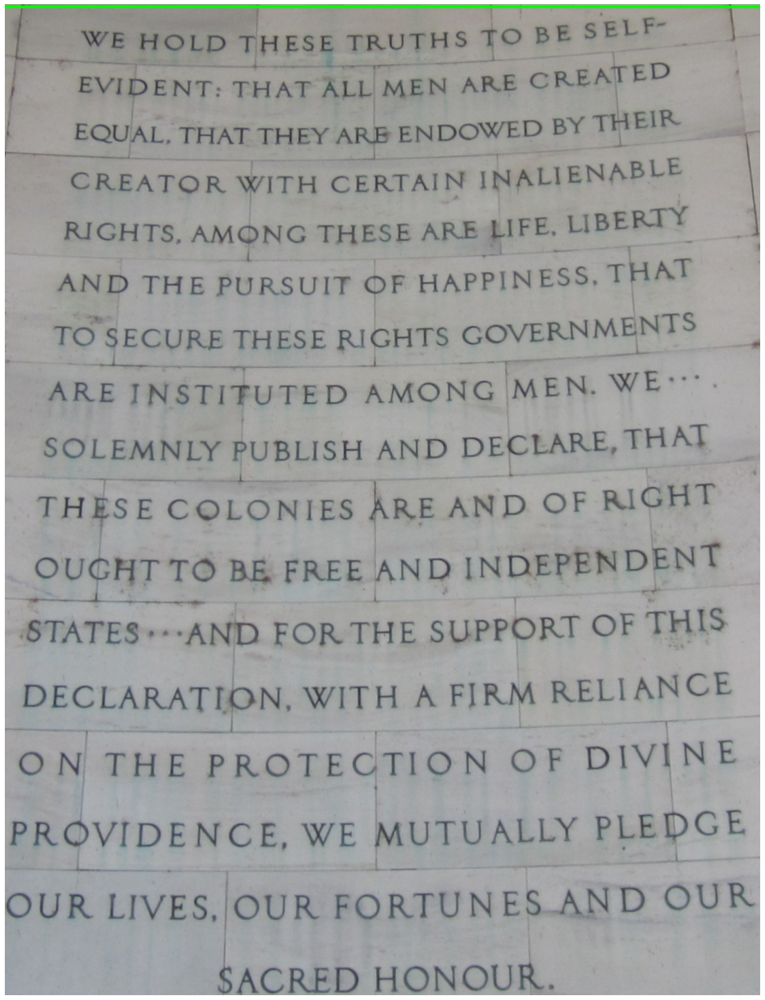

In [57]:
# Showing the blurred image
jimshow(blurred_image)

In [58]:
#Flattening the image to black and white
grey = cv2.cvtColor(blurred_image, cv2.COLOR_BGR2GRAY) #Input is blurred_image, the second paramter is Blue,Green,Red to gray 

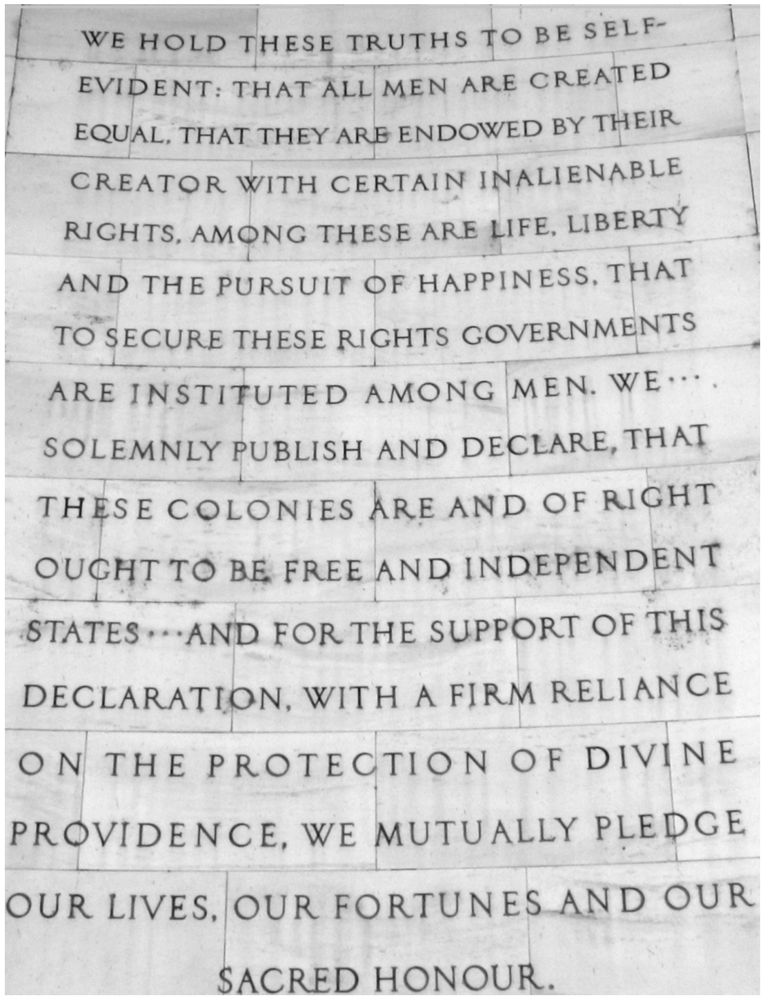

In [59]:
# Showing the flattened image
jimshow_channel(grey)

In [60]:
# Using canny edge detection
canny = cv2.Canny(grey, 100, 200) #First paramter is the flattened image, Second and third arguments are our minVal and maxVal.

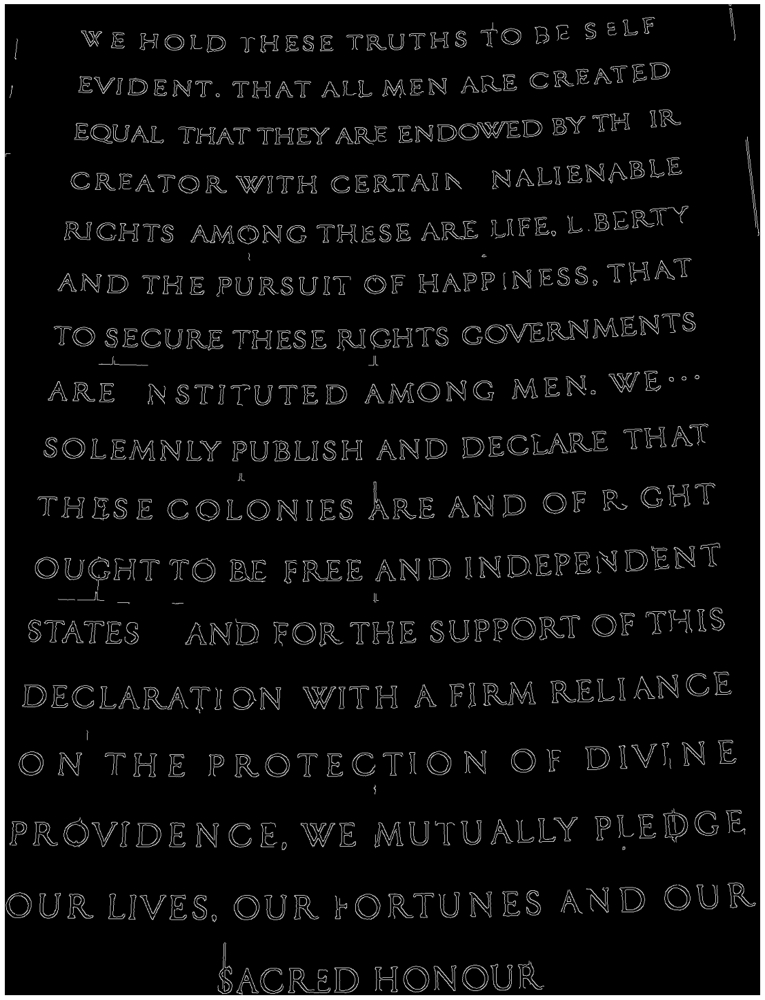

In [61]:
# Showing the canny image
jimshow_channel(canny)

In [62]:
# Using the "findContours" cv2 function to find all the contours from the canny image
    contours, _ =cv2.findContours(canny.copy(), # We copy it so that we don't overwrite the original image
    cv2.RETR_EXTERNAL, # This takes only the external structures 
    cv2.CHAIN_APPROX_SIMPLE, ) # The method of getting approximated contours

In [63]:
 # The original cropped image with contour overlay
image_letters =cv2.drawContours(cropped_image.copy(), # draw contours on original
contours, # our list of contours
-1, #which contours to draw -1 means all. 
(0, 255, 0), # contour color
2) # contour pixel width

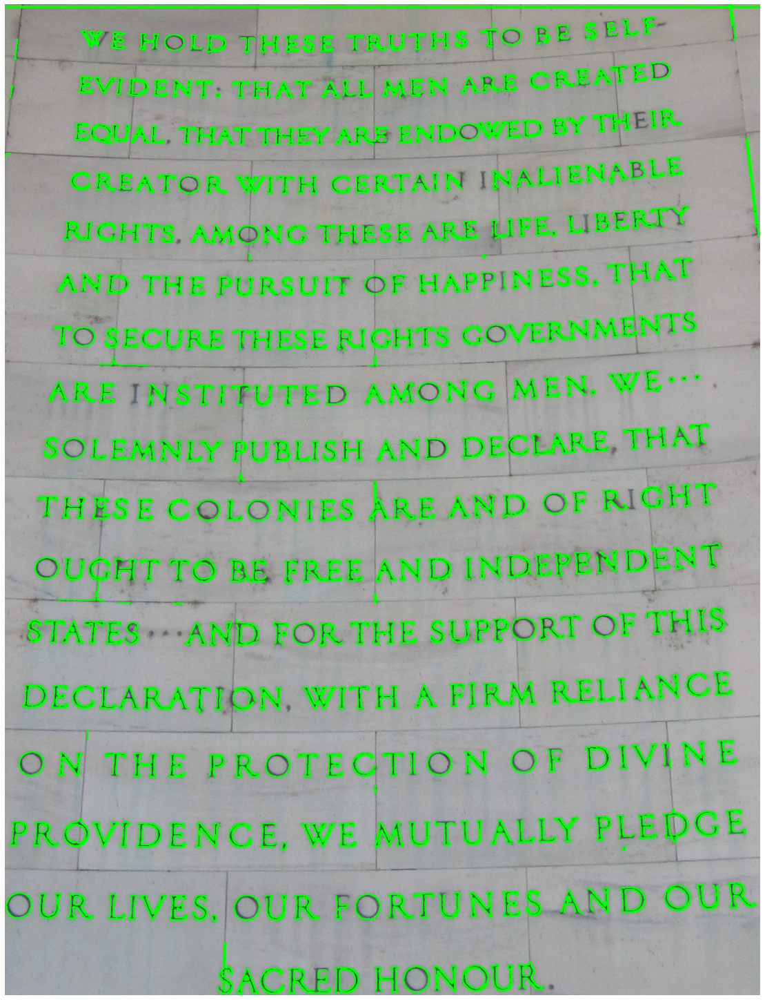

In [64]:
# Showing the contours on the image
jimshow(image_letters)

In [65]:
# Save the image as image_letters.jpg
cv2.imwrite(os.path.join("..", "Output", "image_letters.jpg"), image_letters)

True